In [1]:
%load_ext autoreload
%autoreload 2
%config InlineBackend.figure_format = 'retina'

In [2]:
import scanpy as sc
import pandas as pd
import scanpy as sc 
import sys 
import matplotlib.pyplot as plt
import pandas as pd
import warnings
import matplotlib.pyplot as plt

warnings.filterwarnings('ignore')
sys.path.append('../../src')

from spaceoracle.virtual_tissue import VirtualTissue

In [3]:
adata = sc.read_h5ad('/Users/koush/Desktop/training_data/mouse_kidney_13.h5ad')
adata

AnnData object with n_obs × n_vars = 8509 × 3058
    obs: 'ct1', 'ct2', 'ct3', 'ct4', 'cond', 'medulla_cortex', 'domain', 'cell_type', 'cell_type_int'
    uns: 'cell_thresholds', 'cell_type_colors', 'neighbors', 'pca', 'received_ligands', 'received_ligands_tfl', 'umap'
    obsm: 'X_pca', 'X_umap', 'spatial', 'spatial_unscaled'
    varm: 'PCs'
    layers: 'imputed_count', 'normalized_count', 'raw_count'
    obsp: 'connectivities', 'distances'

In [4]:
import json

with open('./colors.json', 'r') as f:
    color_dict = json.load(f)

In [5]:
%matplotlib inline

In [6]:
xy = pd.DataFrame(adata.obsm['spatial'], columns=['x', 'y'], index=adata.obs_names)
dfxy = xy.join(adata.obs).join(adata.to_df(layer='imputed_count'))
dfxy = dfxy[dfxy.x > 500]

In [7]:
adata = adata[dfxy.index]

In [8]:
plt.rcParams['figure.figsize'] = (30, 12)
plt.rcParams['figure.dpi'] = 200
df = dfxy
fig, axes = plt.subplots(1, 2)
axes = axes.flatten()
ct_interest = ['Mac_0', 'Mac_2']

ct3_mapping = {
    'Mac_0': "#9671c3",
    'Mac_2': "#69a75f"
}

for i, cell_type in enumerate(ct_interest):
    ax = axes[i]
    df_ = df[df['ct3'] == cell_type]
    
    ax.scatter(
        df['x'], df['y'],
        c='grey',
        alpha=0.5,
        s=20, marker='o',
        linewidth=0.1, edgecolor='black',
    )

    ax.scatter(
        df_['x'], df_['y'],
        c=ct3_mapping[cell_type],
        s=90, marker='o',
        linewidth=0.0, edgecolor='black',
    )
    
    ax.set_axis_off()
    ax.set_title(cell_type, fontsize=40)

axes[0].set_title('Hypertonic Macrophages', fontsize=40)
axes[1].set_title('Regular Macrophages', fontsize=40)

plt.savefig(
    './figures/celltypes.svg', 
    dpi=300, 
    bbox_inches='tight', 
    format='svg', 
    transparent=True
)
plt.tight_layout()
plt.show()

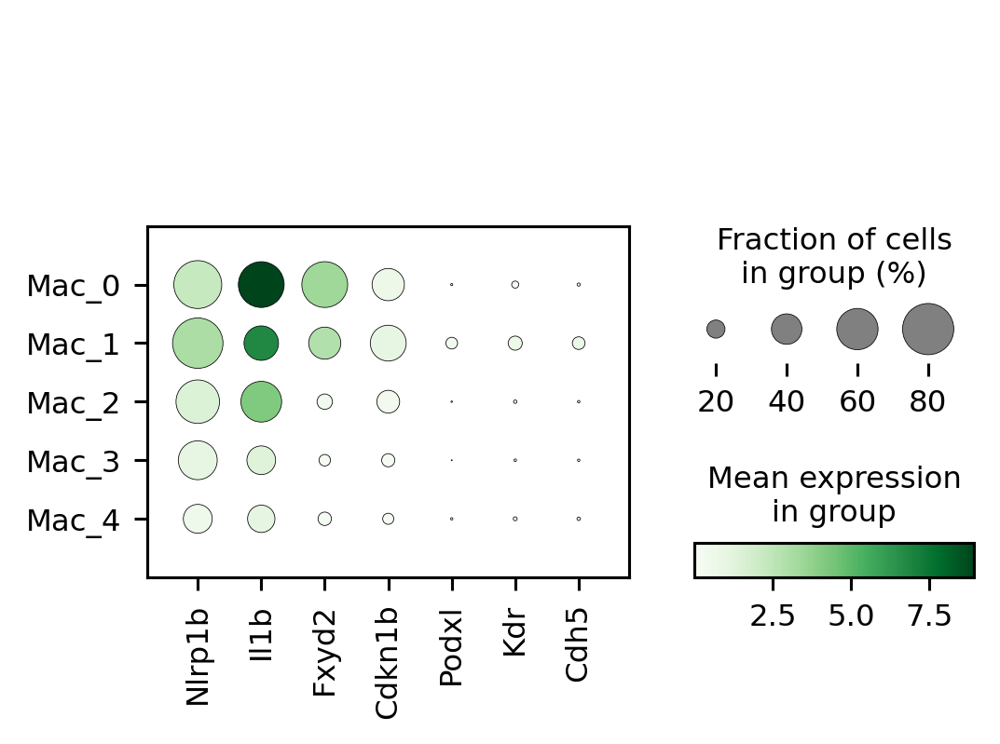

In [9]:
plt.rcParams['figure.figsize'] = (10, 5)
plt.rcParams['figure.dpi'] = 140

adatax = adata[adata.obs.ct3.isin([
        'Mac_2',
        'Mac_0',
        'Mac_3_TGFB3+',
        'Mac_4',
        'Mac_1_CellCycle+_1',
        'Mac_1_CellCycle+_0'
    ])]

adatax.obs['ct4'] = adatax.obs['ct3'].str.replace(
    'Mac_1_CellCycle+_0', 'Mac_1').str.replace(
        'Mac_1_CellCycle+_1', 'Mac_1').str.replace(
        'Mac_3_TGFB3+', 'Mac_3')

sc.pl.dotplot(
    adatax, 
    var_names=['Nlrp1b', 'Il1b', 'Fxyd2', 'Cdkn1b', 'Podxl', 'Kdr', 'Cdh5'], 
    groupby='ct4', cmap='Greens', 
    show=False)

plt.savefig('./figures/dotplot_GC.svg', dpi=300, bbox_inches='tight', format='svg', transparent=True)
plt.show()

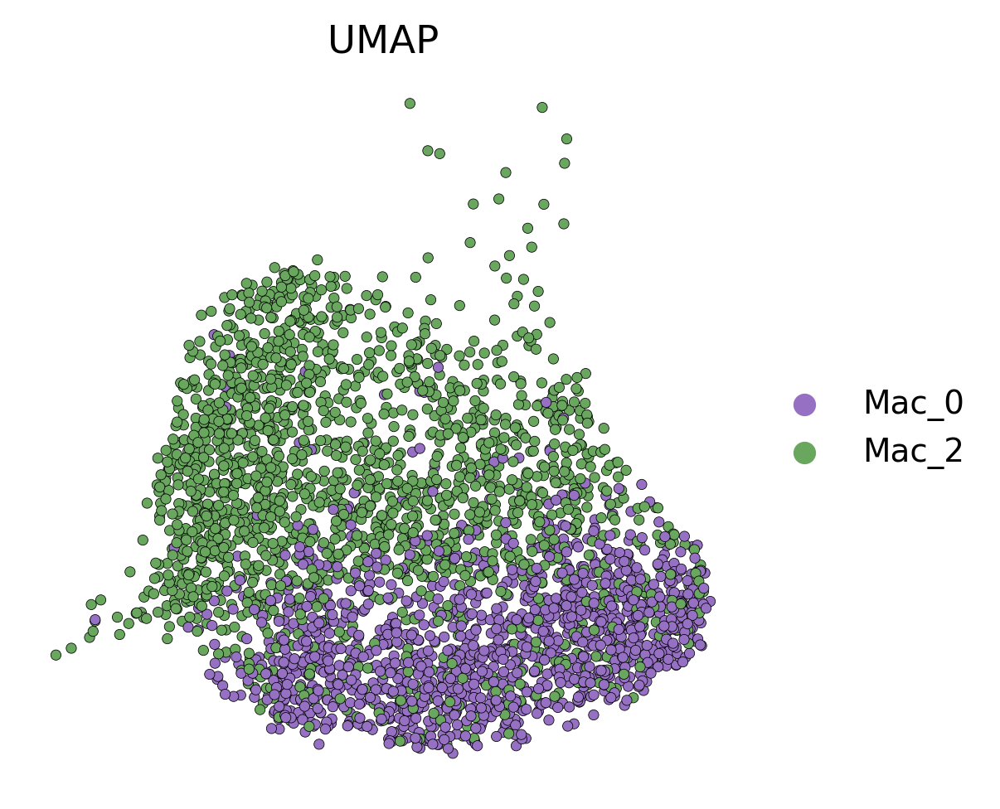

In [10]:
plt.rcParams['figure.figsize'] = [4, 4]
plt.rcParams['figure.dpi'] = 140

adatax = adata[adata.obs.ct3.isin([
        'Mac_2',
        'Mac_0',
        # 'Mac_3_TGFB3+',
        # 'Mac_4',
        # 'Mac_1_CellCycle+_1',
        # 'Mac_1_CellCycle+_0'
    ])]

sc.pl.umap(adatax, color='ct3', s=40, 
    frameon=False, palette=color_dict, 
    add_outline=False, title='UMAP', 
    linewidth=0.2, edgecolor='black', show=False)

plt.savefig(
    './figures/umap_features.svg', 
    dpi=300,
    bbox_inches='tight', 
    format='svg', 
    transparent=True
)

plt.show()

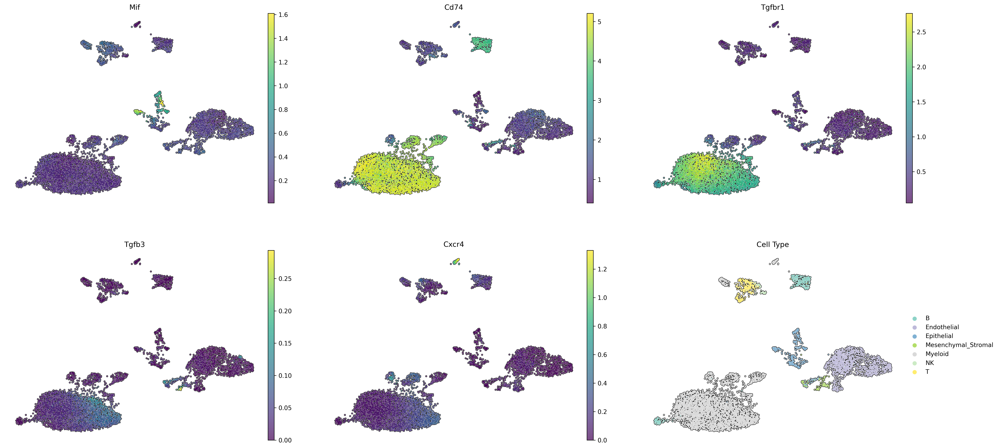

In [11]:
plt.rcParams['figure.figsize'] = [8, 6]
plt.rcParams['figure.dpi'] = 140


sc.pl.embedding(
    adata,
    basis='umap',
    color=['Mif', 'Cd74', 'Tgfbr1', 'Tgfb3', 'Cxcr4', 'ct1'],
    show=False,
    palette='Set3',
    ncols=3,
    frameon=False,
    add_outline=True,
    layer='imputed_count',
    title=['Mif', 'Cd74', 'Tgfbr1', 'Tgfb3', 'Cxcr4', 'Cell Type'],
    
)
plt.tight_layout()
plt.savefig(
    './figures/umap_features.svg', 
    dpi=300,
    bbox_inches='tight', 
    format='svg', 
    transparent=True
)

plt.show()

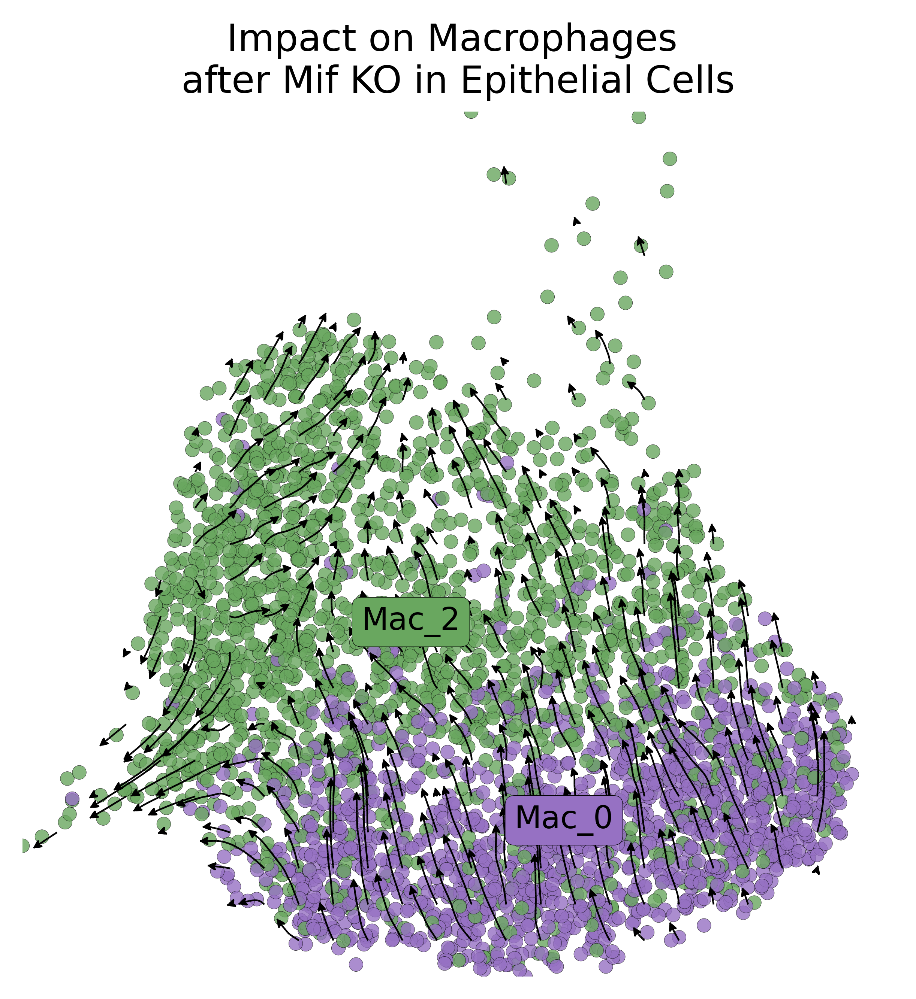

In [12]:
kidney = VirtualTissue(
    adata = adata,
    annot = 'ct3',
    color_dict=color_dict
)

kidney.init_cartography(adata, 
    restrict_to=[
        'Mac_2',
        'Mac_0'
    ]
)

perturbed_df = pd.read_parquet(f'/Users/koush/Downloads/Mif_KO_Epithelial.parquet')

kidney.plot_arrows(
    perturb_target='Mif', 
    mode='0',
    perturbed_df=perturbed_df,
    hue='ct3',
    curve=True,
    vector_scale=1, 
    grid_scale=2,
    n_neighbors=300,
    scale=7,
    grains=25,
    limit_clusters=True,
    scatter_size=20,
    legend_fontsize=10,
    highlight_clusters=[
        'Mac_2',
        'Mac_0'
    ],
    grey_out=False
)

plt.title('Impact on Macrophages \nafter Mif KO in Epithelial Cells')
plt.savefig(
    './figures/Mif_KO_epithelial.svg', 
    dpi=300, 
    bbox_inches='tight', 
    format='svg', 
    transparent=True
)
plt.show()

In [13]:
kidney.betadatas_path

In [8]:
from spaceoracle.visionary import Visionary
import scanpy as sc
import pandas as pd
import sys
sys.path.append('../../src')

import warnings
warnings.simplefilter("ignore", category=UserWarning)

test_adata = sc.read_h5ad('/Users/koush/Desktop/training_data/mouse_kidney_visiumHD_subsampled.h5ad')
ref_adata = sc.read_h5ad('/Users/koush/Desktop/training_data/mouse_kidney_13.h5ad')
ref_models_dir = '/Volumes/SSD/lasso_runs/mouse_kidney_13'
matching = pd.read_csv('../../notebooks/mouse_kidney_survey/matching_slat_banksy.csv', index_col=0)

renata = Visionary(
    # ref_adata = ref_adata,
    test_adata = test_adata,
    ref_json_path = f'{ref_models_dir}/run_params.json',
    subsample=1,
    matching_annot='cell_type',
    prematching=matching
)

TypeError: __init__() got an unexpected keyword argument 'test_adata'